# Multilingual Speech to Image generation


$$\text{Nishant Verma(12241170)}$$

$$\text{Rajeev Goel(12241460)}$$

$$\text{Soni Kumari(12241780)}$$


###Installing necessary libraries

Here We have used
- ffmpeg-python : to record the audio in .wav format using device's microphone.
- whisper : To load the audio and get the translation
- diffusers, transformers, scip, ftfy to import a huggingface model "prompthero/openjourney-v4" and further use it.

In [ ]:
!pip install -U openai-whisper

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 800.5/800.5 kB 9.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.5/209.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 47.3 MB/s eta 0:00:00
  Created wheel for openai-whisper: filename=openai_whisper-20240930-py3-none-any.whl size=803320 sha256=8a50721a9408789ee85f104ef773c1c6086c1202e074cc27b33e3eab5a43b7e2
  Stored in directory: /root/.cache/pip/wheels/dd/4a/1f/d1c4bf3b9133c8168fe617ed979cab7b14fe381d059ffb9d83
Successfully built openai-whisper


In [ ]:
!pip install git+https://github.com/openai/whisper.git

  Cloning https://github.com/openai/whisper.git to /tmp/pip-req-build-0xxxzz7e
  Running command git clone --filter=blob:none --quiet https://github.com/openai/whisper.git /tmp/pip-req-build-0xxxzz7e
  Resolved https://github.com/openai/whisper.git to commit 173ff7dd1d9fb1c4fddea0d41d704cfefeb8908c
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!pip install ffmpeg-python

In [ ]:
!pip install diffusers transformers scipy ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.6 MB/s eta 0:00:00


In [ ]:
!pip install transformers torch torchvision pillow

### Importing the "prompthero/openjourney-v4" model form HuggingFace.

- Here we are importing a stable diffusion pipeline utilising the "prompthero/openjourney-v4" model.
- then using StableDiffusionImg2ImgPipeline() we are achieiving the context retention over generated prompt, using the first_image variable.
- Finally, using the generate_image() we are generating the image of prompt.
- Here, we are using some hyperparameters:
  - num_interface_steps = 30 (standard in 50)
  - height and width as 512 (is standard)


This speeds up the image generation process by 1.5 times!

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
from diffusers import StableDiffusionPipeline, StableDiffusionImg2ImgPipeline

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

pipe = StableDiffusionPipeline.from_pretrained(
    "prompthero/openjourney-v4",
    torch_dtype=torch.float16
)
pipe = pipe.to(device)
img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "prompthero/openjourney-v4",
    torch_dtype=torch.float16
)
img2img_pipe = img2img_pipe.to(device)
def generate_image(prompt, image=None, num_inference_steps=30, height=512, width=512):
    if image is None:
        image = pipe(prompt, num_inference_steps=num_inference_steps, height=height, width=width).images[0]
    else:
        image = img2img_pipe(prompt, image=image, num_inference_steps=num_inference_steps, height=height, width=width).images[0]
    return image


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/582 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.53k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/602 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/465 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/520 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/755 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/610 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### Using ffmpeg we are enabling the system's microphone to record audio

- We are using the javascript to access the recorder of the system.
- Running it for some defined no. of seconds.
- Saving the audio file as my_audio.wav


In [ ]:
from IPython.display import Javascript
from google.colab import output
from base64 import b64decode

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})

var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record_audio(sec=5):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  return b

In [ ]:
import ffmpeg

def save_as_wav(audio_data, filename="audio.wav"):
  process = (
      ffmpeg
      .input('pipe:', format='webm')
      .output(filename, format='wav', acodec='pcm_s16le', ac=1, ar='16k')
      .overwrite_output()
      .run_async(pipe_stdin=True)
  )
  process.stdin.write(audio_data)
  process.stdin.close()
  process.wait()

### Using Whisper for speech recognition



*   Recorded speech will be given to whisper which automatically detect the language and transcribe it.
*   Then the transcribed text will be converted to english language
*   And then the translated text will be passed further for image generation



In [ ]:
import whisper
model = whisper.load_model("medium")

/usr/local/lib/python3.10/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(fp, map_location=device)


### Defining necessary function for clean pipeline

- record(time) :
  - **time** parameter is used to secify the no. of seconds we wnat to record the audio.
  - This Fuction to record the audio and save it as "my_audio.wav". and returning the path.
- speech_to_text(audio):
  - **audio** is the path of the audio.
  - **speech_recognition** is used here for this.
  - Audio can be in hindi or english.
  - Audio file must be in .wav format which is taken care by the by **ffmpeg** while recording
- translate_to_english(text):
  - **text** is the text transcribed by the speech_recogniizer.
  - using the googletrans
- generate_sub_sentences(text, beam_size)
  - is used to generate the sequential prompts with words varying by beam_size of 3
  - prompt = "A cat is sitting on a mat"
  
    Output
    ```
    [
      "A cat is",
      "A cat is sitting on a",
      "A cat is sitting on a mat"
    ]

  

In [ ]:
def record(time):
  print("Recording...")
  audio_data = record_audio(time)
  save_as_wav(audio_data, "my_audio.wav")
  return "my_audio.wav"

In [ ]:
import librosa
def speech_to_trans_text(audio):
  y, sr = librosa.load(audio, sr=None)
  y = whisper.pad_or_trim(y)
  mel = whisper.log_mel_spectrogram(y).to(model.device)

  lang = model.detect_language(mel=mel)
  lang_prob_tuples = list(lang[1].items())
  sorted_langs = sorted(lang_prob_tuples, key=lambda item: item[1], reverse=True)
  most_probable_lang = sorted_langs[0][0]
  print("Detected Language : ", most_probable_lang)

  text = model.transcribe(audio, task="translate")
  print("Transcribed Text : ", text['text'])
  return text['text']

In [ ]:
def generate_sub_sentences(text, beam_size):
    words = text.split()
    sub_sentences = [""]

    for i in range(0, len(words), beam_size):
        sub_sentence = ' '.join([sub_sentences[-1], ' '.join(words[i:i + beam_size])]).strip()
        sub_sentences.append(sub_sentence)

    return sub_sentences[1:]

## One-time image generation from prompt

### PipeLine

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def Pipeline():
  audio = record(5)
  text = speech_to_trans_text(audio)
  refined_prompt = refine(text)
  if(text):
    sub_sentences = generate_sub_sentences(text, beam_size=3)
    first_image = None
    for prompt in sub_sentences:
        print(prompt)
        image = generate_image(prompt, first_image)
        if(prompt == sub_sentences[-1]):
          image.save(f"{sub_sentences[0]}.png")
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        first_image = image


###Sample Outputs

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  सूर्यास्त की सुनहरी रोशनी में एक क्षण
Translated Text :  A moment in the golden light of sunset
A moment in


  0%|          | 0/50 [00:00<?, ?it/s]

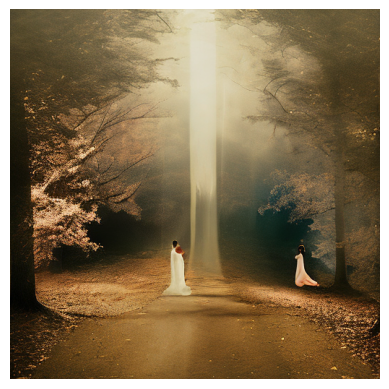

A moment in the golden light


  0%|          | 0/40 [00:00<?, ?it/s]

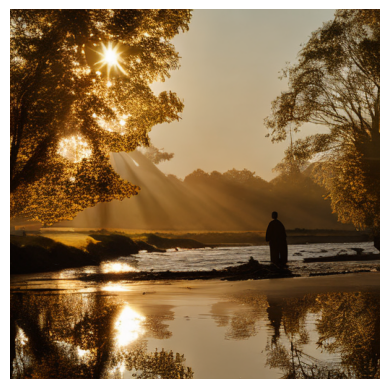

A moment in the golden light of sunset


  0%|          | 0/40 [00:00<?, ?it/s]

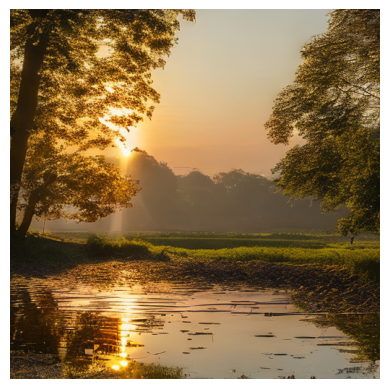

In [ ]:
Pipeline()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  नाच न जाने आंगन टेढ़ा
Translated Text :  A bad workman blames his tools.
A bad workman


  0%|          | 0/50 [00:00<?, ?it/s]

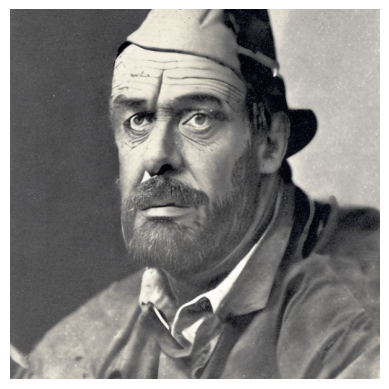

A bad workman blames his tools.


  0%|          | 0/40 [00:00<?, ?it/s]

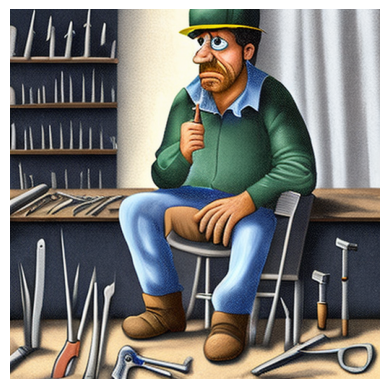

In [ ]:
Pipeline()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  छठ दिनम
Translated Text :  Chhath Dinam
Chhath Dinam


  0%|          | 0/50 [00:00<?, ?it/s]

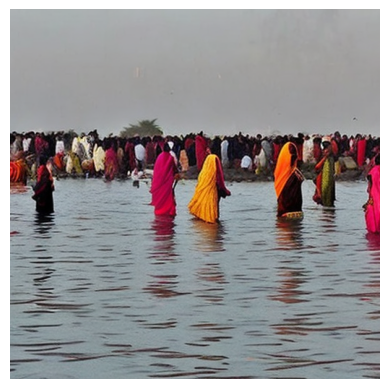

In [ ]:
Pipeline()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  एक खरगोश सरसों के खेत में
Translated Text :  A rabbit in a mustard field
A rabbit in


  0%|          | 0/50 [00:00<?, ?it/s]

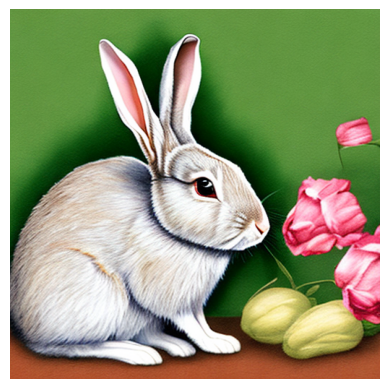

A rabbit in a mustard field


  0%|          | 0/40 [00:00<?, ?it/s]

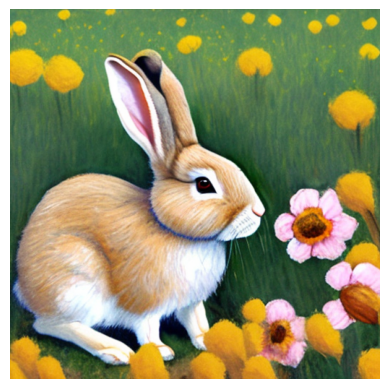

In [ ]:
Pipeline()

## Recurrent Image generation from prompts


### Pipeline with loop

In [ ]:
def Pipeline_with_loop():
  first_image = None
  while True:
    audio = record(3)
    text = speech_to_trans_text(audio)
    if(text):
      sub_sentences = generate_sub_sentences(text, beam_size=3)
      for prompt in sub_sentences:
          print(prompt)
          image = generate_image(prompt, first_image)
          image.save(f"{prompt}.png")
          plt.imshow(image)
          plt.axis('off')
          plt.show()
          first_image = image
      print("Do you want to continue? (y/n)")
      response = input().lower()
      if response != 'y':
          break

### Samples

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  सूर्यास्त होता हुआ
Translated Text :  sunset
sunset


  0%|          | 0/50 [00:00<?, ?it/s]

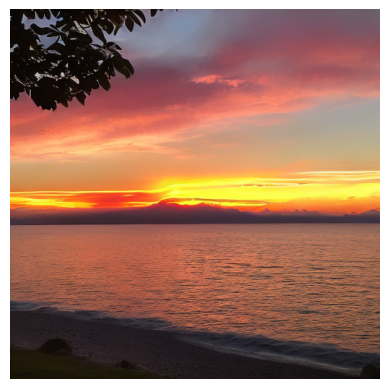

Do you want to continue? (y/n)
y
Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  एक आदमी खड़ा हुआ है
Translated Text :  a man is standing
a man is


  0%|          | 0/40 [00:00<?, ?it/s]

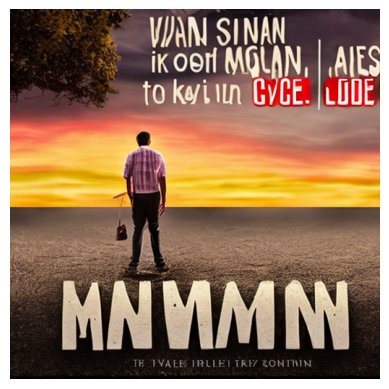

a man is standing


  0%|          | 0/40 [00:00<?, ?it/s]

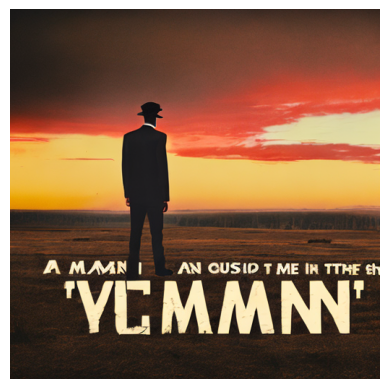

Do you want to continue? (y/n)
y
Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  ऊपर से बम गिर रहे हैं
Translated Text :  bombs falling from above
bombs falling from


  0%|          | 0/40 [00:00<?, ?it/s]

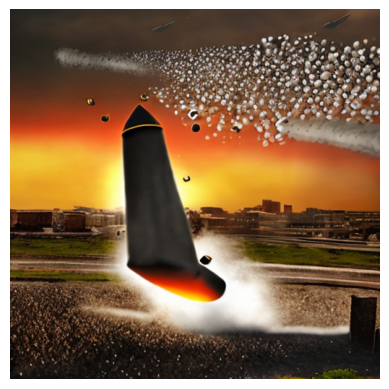

bombs falling from above


  0%|          | 0/40 [00:00<?, ?it/s]

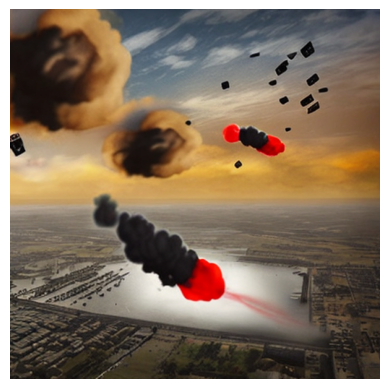

Do you want to continue? (y/n)
n


In [ ]:
Pipeline_with_loop()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  एक पहाड़ के ऊपर सूर्यास्त हो रहा है
Translated Text :  sunset over a mountain
sunset over a


  0%|          | 0/50 [00:00<?, ?it/s]

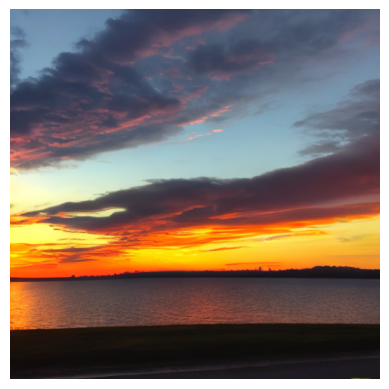

sunset over a mountain


  0%|          | 0/40 [00:00<?, ?it/s]

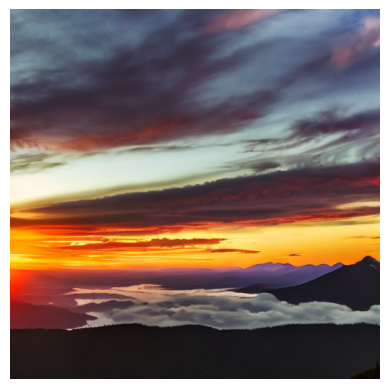

Do you want to continue? (y/n)
y
Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  अब पहाड़ के पास एक झील
Translated Text :  now a lake near the mountain
now a lake


  0%|          | 0/40 [00:00<?, ?it/s]

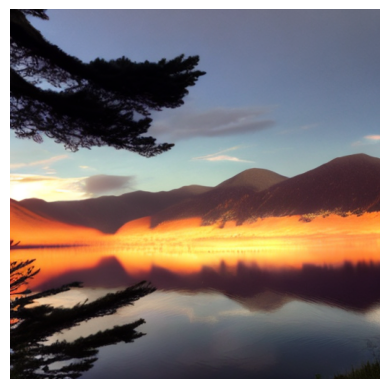

now a lake near the mountain


  0%|          | 0/40 [00:00<?, ?it/s]

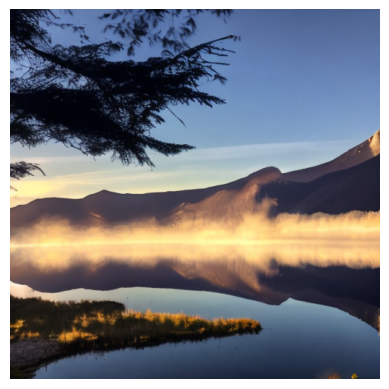

Do you want to continue? (y/n)
y
Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  झील में सूर्य का प्रतिबिंब दिखाई दे
Translated Text :  Sun's reflection visible in the lake
Sun's reflection visible


  0%|          | 0/40 [00:00<?, ?it/s]

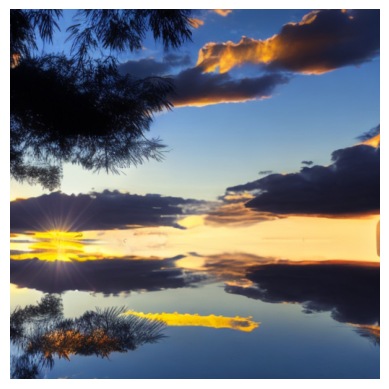

Sun's reflection visible in the lake


  0%|          | 0/40 [00:00<?, ?it/s]

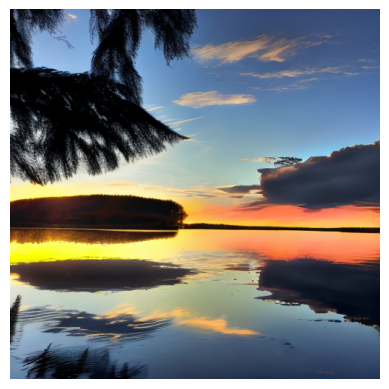

Do you want to continue? (y/n)
n


In [ ]:
Pipeline_with_loop()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  सनसेट ओवर माउंटेन
Translated Text :  Sunset Over Mountain
Sunset Over Mountain


  0%|          | 0/50 [00:00<?, ?it/s]

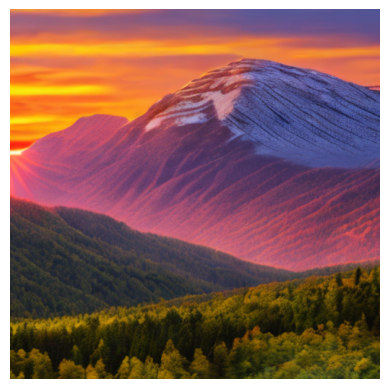

Do you want to continue? (y/n)
y
Recording...


<IPython.core.display.Javascript object>

Transcribed Text :  ए प्लेन इस फ्लाइंग ओवर थे माउंटेन
Translated Text :  A plane is flying over the mountain
A plane is


  0%|          | 0/40 [00:00<?, ?it/s]

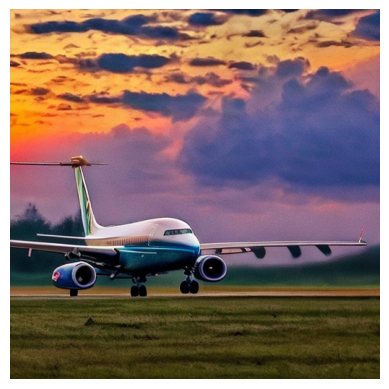

A plane is flying over the


  0%|          | 0/40 [00:00<?, ?it/s]

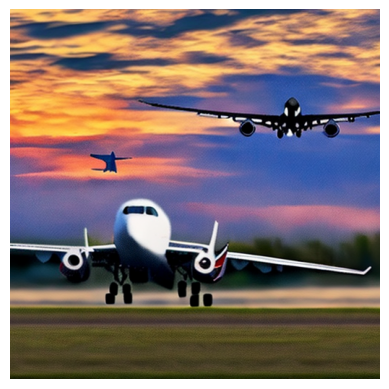

A plane is flying over the mountain


  0%|          | 0/40 [00:00<?, ?it/s]

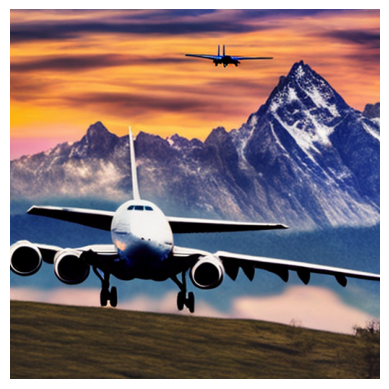

Do you want to continue? (y/n)
n


In [ ]:
Pipeline_with_loop()

## User Prompt Refiner

We are using **Qwen/Qwen2.5-1.5B-Instruct** as a prompt refiner for the user input query.


*   It is designed to take the user input and output refined prompt which make the image generation more accurate.
*   This model is instructed with system prompt for what task it have to do.
*   So we will call the defined function refiner from our pipeline which will give us the refined prompt.



In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer

model_name = "Qwen/Qwen2.5-1.5B-Instruct"

refiner_model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype="auto",
    device_map="auto"
)
tokenizer = AutoTokenizer.from_pretrained(model_name)
sys_prompt = """
    You are a prompt refiner for image generation. Your task is to refine the user's input prompt to create high-quality and detailed images.

    Here's how you should refine the prompts:
    1. Understand the user's intent.
    2. Maintain clarity and conciseness.

    Example:
    User Input: A cat sitting on a mat
    Refined Prompt: A fluffy Persian cat with piercing blue eyes sitting gracefully on a woven mat.
    """


In [ ]:
# The refiner function

def refiner(prompt):
  messages = [
      {"role": "system", "content": sys_prompt},
      {"role": "user", "content": prompt}
  ]
  text = tokenizer.apply_chat_template(
      messages,
      tokenize=False,
      add_generation_prompt=True
  )
  model_inputs = tokenizer([text], return_tensors="pt").to(refiner_model.device)

  generated_ids = refiner_model.generate(
      **model_inputs,
      max_new_tokens=512
  )
  generated_ids = [
      output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
  ]

  response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
  return response

##Metric Evaluator

In [ ]:
!pip install lpips --quiet
!pip install scikit-image --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.8 MB/s eta 0:00:00


### Dataset used for evaluation

In [ ]:
%%capture
!kaggle datasets download farhanhaikhan/general-purpose-image-dataset
!unzip general-purpose-image-dataset.zip
!rm -rf general-purpose-image-dataset.zip

### Using Blip For captioning image


*   For evaluating our image generation pipeline we are using Blip Model
*   First we generate caption from the referenced image.
*   Then we will generate image from the generated caption image
*   Also we will refine the generated caption with the function we defined above and generate image from refined caption
*   Then we will compare the generated image for both case with the original image



In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import Image

captioning_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
captioning_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

captioning_model.eval()

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

BlipForConditionalGeneration(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-0

In [ ]:
def generate_caption(image_path):
    image = Image.open(image_path)
    inputs = captioning_processor(images=image, return_tensors="pt")

    with torch.no_grad():
        output_ids = captioning_model.generate(**inputs)

    caption = captioning_processor.decode(output_ids[0], skip_special_tokens=True)
    return caption

### Using PSNR, SSIM, LPIPS for evaluation

**PSNR (Peak Signal-to-Noise Ratio)**

* Higher PSNR values generally indicate better image quality, meaning the generated image is closer to the target image.

**SSIM (Structural Similarity Index)**

* SSIM measures the similarity between two images based on their structure and textures.
* Similar to PSNR, higher SSIM scores indicate better image quality and similarity to the target.

**LPIPS (Learned Perceptual Image Patch Similarity)**

* LPIPS is a more advanced metric that assesses image similarity based on human perception.
* Lower LPIPS scores are better, indicating that the images are perceptually more similar.


In [ ]:
import lpips
import numpy as np
from skimage.metrics import structural_similarity as ssim
from PIL import Image
import torch


def calculate_psnr(img1, img2):
    mse = np.mean((np.array(img1) - np.array(img2)) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

# Function to calculate LPIPS score
loss_fn_alex = lpips.LPIPS(net='alex') # best forward scores

def calculate_lpips(img1, img2):
    img1 = np.array(img1).astype(np.float32) / 255.0
    img2 = np.array(img2).astype(np.float32) / 255.0
    img1 = torch.from_numpy(img1).permute(2,0,1).unsqueeze(0)
    img2 = torch.from_numpy(img2).permute(2,0,1).unsqueeze(0)

    # Ensure images are in the correct range
    img1 = torch.clamp(img1, 0, 1)
    img2 = torch.clamp(img2, 0, 1)

    return loss_fn_alex(img1, img2).item()


def calculate_metrics(target_img_path, user_img):
    # Load images
    target_image = Image.open(target_img_path).convert("RGB").resize((512,512))
    user_image = user_img

    # Calculate PSNR
    psnr_score = calculate_psnr(target_image, user_image)

    # Calculate SSIM
    ssim_score = ssim(np.array(target_image), np.array(user_image), multichannel=True, channel_axis=2)

    # Calculate LPIPS
    lpips_score = calculate_lpips(target_image, user_image)

    return psnr_score, ssim_score, lpips_score

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 102MB/s] 


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


/usr/local/lib/python3.10/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

### Sample demo

In [ ]:
def image_cap_img(image_path):
  caption = generate_caption(image_path)
  refined_caption = refiner(caption)
  print(caption)
  print(refined_caption)
  image_original = generate_image(caption, None)
  image_refined = generate_image(refined_caption, None)
  return image_original, image_refined

In [ ]:
image_path = "/content/dataset/Cats/Image_100.jpg"
image_original, image_refined = image_cap_img(image_path)
metric_original = calculate_metrics(image_path, image_original)
metric_refined = calculate_metrics(image_path, image_refined)

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1375: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


a cat is being a hand to a person
A muscular man with a warm smile holds hands gently with his playful, curious cat, who paws playfully at his fingers.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


In [ ]:
print(metric_original)
print(metric_refined)

(27.89569783699529, 0.37605941969112083, 0.7303589582443237)
(27.856010985740593, 0.0004189773160196363, 0.661902666091919)


### Pipeline for Image captioning to image generation from generted caption and refined caption

In [ ]:
def Pipeline():
  # audio = record(5)
  # text = speech_to_trans_text(audio)
  text = "a cat is giving its paws in the hand to a person"
  refined_prompt = refiner(text)
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))
  if(text):
    # translation = translate_to_english(text)
    # sub_sentences = generate_sub_sentences(text, beam_size=3)
    first_image = None
    image1 = generate_image(text, first_image)
    image1.save(f"{text}.png")
    print(f"Refined Prompt:{refined_prompt}")
    print("Refined Image:")
    axes[0].imshow(image1)
    axes[0].axis('off')

    first_image = None
    image2 = generate_image(refined_prompt, first_image)
    image2.save(f"refine_{text}.png")
    print(f"Refined Prompt:{refined_prompt}")
    print("Refined Image:")
    axes[1].imshow(image2)
    axes[1].axis('off')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


  0%|          | 0/30 [00:00<?, ?it/s]

Refined Prompt:A playful tabby cat gently places its paw in the palm of a smiling human, inviting gentle affection.
Refined Image:


  0%|          | 0/30 [00:00<?, ?it/s]

Refined Prompt:A playful tabby cat gently places its paw in the palm of a smiling human, inviting gentle affection.
Refined Image:


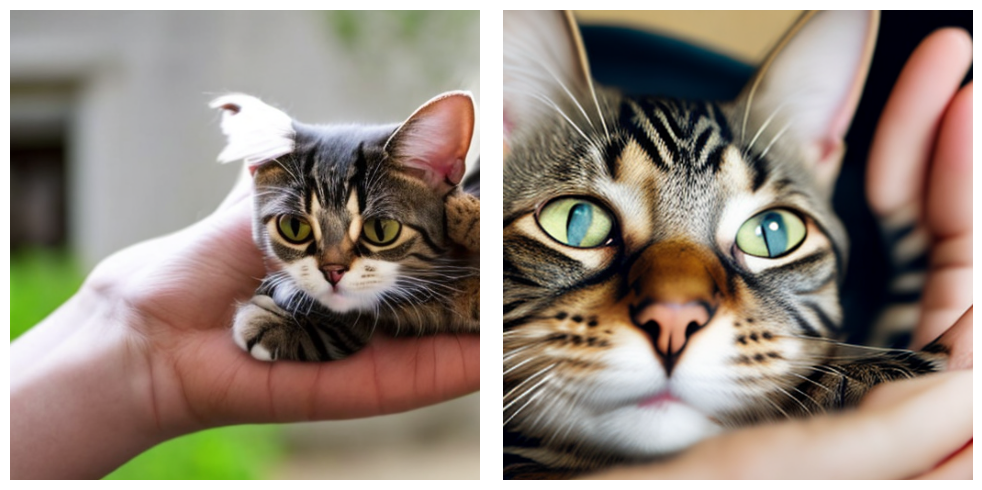

In [ ]:
Pipeline()

### Evaluating for 500 images

In [ ]:
import os
dirs = ['Cats','Dogs','Hills','Lake','Wildlife']
images = []
for dir in dirs:
  path = f'/content/dataset/{dir}'
  image_list = os.listdir(f'/content/dataset/{dir}')
  for image in image_list:
    images.append(f'{path}/{image}')

len(images)

500

In [ ]:
original ={
    "psnr_score": [],
    "ssim_score": [],
    "lpips_score": []
}
refined ={
    "psnr_score": [],
    "ssim_score": [],
    "lpips_score": []
}

In [ ]:
%%capture
import tqdm
i =1
for image in tqdm.tqdm(images):
  print(i)
  i+=1
  image_original, image_refined = image_cap_img(image)
  psnr_score, ssim_score, lpips_score = calculate_metrics(image_path, image_original)
  original["psnr_score"].append(psnr_score)
  original["ssim_score"].append(ssim_score)
  original["lpips_score"].append(lpips_score)
  psnr_score, ssim_score, lpips_score = calculate_metrics(image_path, image_refined)
  refined["psnr_score"].append(psnr_score)
  refined["ssim_score"].append(ssim_score)
  refined["lpips_score"].append(lpips_score)

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
Token indices sequence length is longer than the specified maximum sequence length for this model (105 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [", casting gentle shadows on the furniture . the couch cushions are invitingly soft , and there 's an air of relaxed enjoyment in the scene ."]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['atmosphere .']


In [ ]:
avg_psnr = (sum(original["psnr_score"])/len(original["psnr_score"]), sum(refined["psnr_score"])/len(refined["psnr_score"]))
avg_ssim = (sum(original["ssim_score"])/len(original["ssim_score"]), sum(refined["ssim_score"])/len(refined["ssim_score"]))
avg_lpips = (sum(original["lpips_score"])/len(original["lpips_score"]), sum(refined["lpips_score"])/len(refined["lpips_score"]))

In [ ]:
print("\t\tOriginal Refined  Better")
print(f"PSNR SCORE \t{avg_psnr[0]:.3f} \t {avg_psnr[1]:.3f}  {'Original' if avg_psnr[0] > avg_psnr[1] else 'Refined'}")
print(f"SSIM SCORE \t{avg_ssim[0]:.3f} \t {avg_ssim[1]:.3f} \t {'Original' if avg_ssim[0] > avg_ssim[1] else 'Refined'}")
print(f"LPIPS SCORE \t{avg_lpips[0]:.3f} \t {avg_lpips[1]:.3f} \t {'Original' if avg_lpips[0] < avg_lpips[1] else 'Refined'}")


		Original Refined  Better
PSNR SCORE 	27.902 	 27.899  Original
SSIM SCORE 	0.281 	 0.266 	 Original
LPIPS SCORE 	0.736 	 0.744 	 Original


# Refiner Pipeline

In [ ]:
import matplotlib.pyplot as plt
def Pipeline():
  torch.cuda.empty_cache()
  audio = record(5)
  text = speech_to_trans_text(audio)
  refined_prompt = refiner(text)
  print(f"Refined Prompt:{refined_prompt}")
  fig, axes = plt.subplots(1, 2, figsize=(10, 5))
  if(text):
    # translation = translate_to_english(text)
    # sub_sentences = generate_sub_sentences(text, beam_size=3)
    first_image = None
    image1 = generate_image(text, first_image)
    image1.save(f"{text}.png")
    axes[0].imshow(image1)
    axes[0].axis('off')

    first_image = None
    image2 = generate_image(refined_prompt, first_image)
    image2.save(f"refine_{text}.png")
    axes[1].imshow(image2)
    axes[1].axis('off')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


Recording...


<IPython.core.display.Javascript object>

Transcribed Text :   A deer is walking in the golden light of the sun.
Refined Prompt:A majestic white deer, standing tall and proud, gracefully walks through the warm golden rays of the sun.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

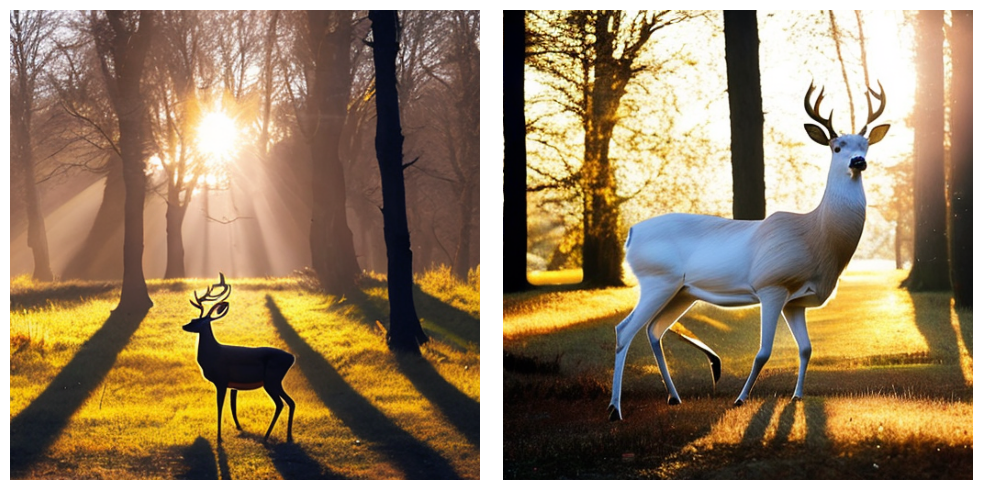

In [ ]:
Pipeline()

Recording...


<IPython.core.display.Javascript object>

Transcribed Text :   Singh Haber Raja Ne Dhag Haadar Le
Refined Prompt:A royal Singh Haber, wearing his finest attire, admiring a majestic stag in its prime condition.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

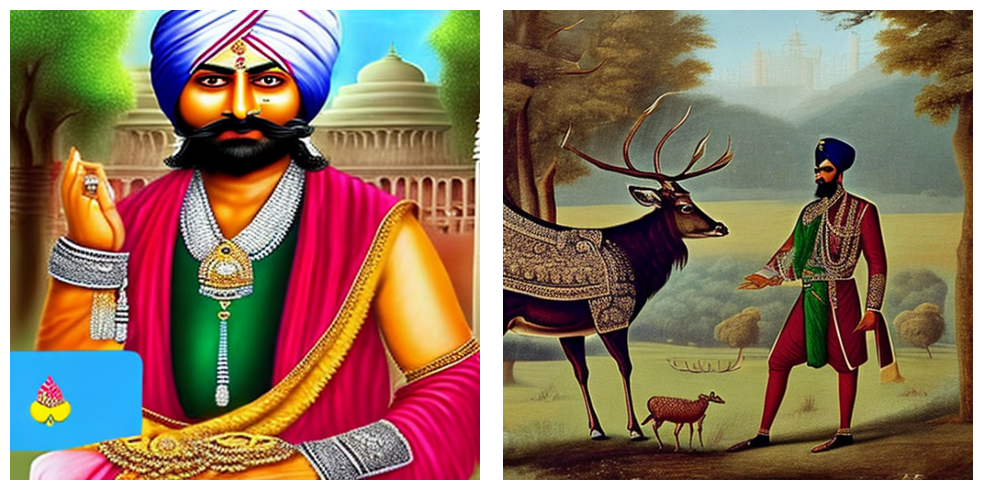

In [ ]:
Pipeline()

These languages are supported currently.

1. Eng (English)  
2. Hin (Hindi)  
3. Tam (Tamil)  
4. Urd (Urdu)  
5. Mal (Malayalam)  
6. Tel (Telugu)  
7. Ben (Bengali)  
8. Kannada  
9. Nep (Nepali)  
10. Mar (Marathi)  
11. Pun (Punjabi)  
12. Guj (Gujarati)  
13. Sindhi  
14. Sanskrit  
15. Asami (Assamese)  

In [ ]:
Pipeline()

Recording...


<IPython.core.display.Javascript object>

Detected Language :  hi
{'text': ' Sh Kawal Nain Rengan Series your class', 'segments': [{'id': 0, 'seek': 0, 'start': 0.0, 'end': 2.0, 'text': ' Sh Kawal Nain Rengan', 'tokens': [50364, 1160, 31795, 304, 426, 491, 497, 1501, 282, 50464], 'temperature': 1.0, 'avg_logprob': -4.786402747744606, 'compression_ratio': 0.8260869565217391, 'no_speech_prob': 0.18918617069721222}, {'id': 1, 'seek': 0, 'start': 2.0, 'end': 3.92, 'text': ' Series', 'tokens': [50464, 13934, 50560], 'temperature': 1.0, 'avg_logprob': -4.786402747744606, 'compression_ratio': 0.8260869565217391, 'no_speech_prob': 0.18918617069721222}, {'id': 2, 'seek': 0, 'start': 3.92, 'end': 10.48, 'text': ' your', 'tokens': [50560, 428, 50888], 'temperature': 1.0, 'avg_logprob': -4.786402747744606, 'compression_ratio': 0.8260869565217391, 'no_speech_prob': 0.18918617069721222}, {'id': 3, 'seek': 0, 'start': 10.48, 'end': 21.66, 'text': ' class', 'tokens': [50888, 1508, 51447], 'temperature': 1.0, 'avg_logprob': -4.786402747744606,